In [32]:
import imageio
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import PIL
import time

from IPython.display import Image
%matplotlib inline

自作のデータセットに対して分類および物体検出を行っていきます。具体的なタスクは講師からの指示に従ってください。


# 【問題1】自作データセットでの分類の学習
自作のデータセットに対して分類問題を解いてください。任意の実装を使用してください。

### データセット作成

In [5]:
# 犬猫画像を読み込み、ndarrayに変換
# 画像はネットから拾ったもの
dataset = []
target = []

path =  './img/' 
for i, image in enumerate([name for name in os.listdir(path) if not name.startswith('.')]):
    #print(image)
    if '.jpg' in image:
        im = PIL.Image.open(path+image)
        im_rgb = im.convert('RGB')
        dataset.append(im_rgb)
        im.close()
        
        # 正解ラベル配列を作成
        if 'cat' in image: 
            target.append(0)
        elif 'dog' in image: 
            target.append(1)

#print(dataset)

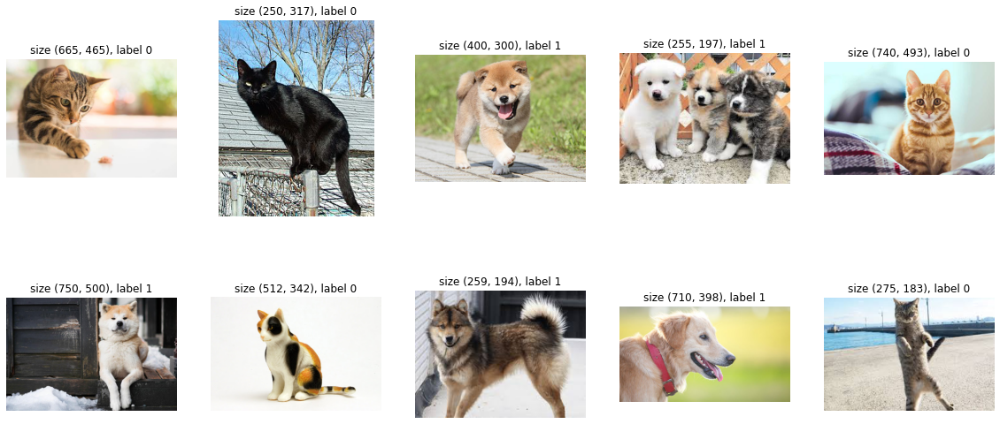

In [6]:
fig = plt.figure(figsize=(20,9))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(dataset[i])
    plt.axis('off')
    plt.title('size {}, label {}'.format(dataset[i].size, target[i]))

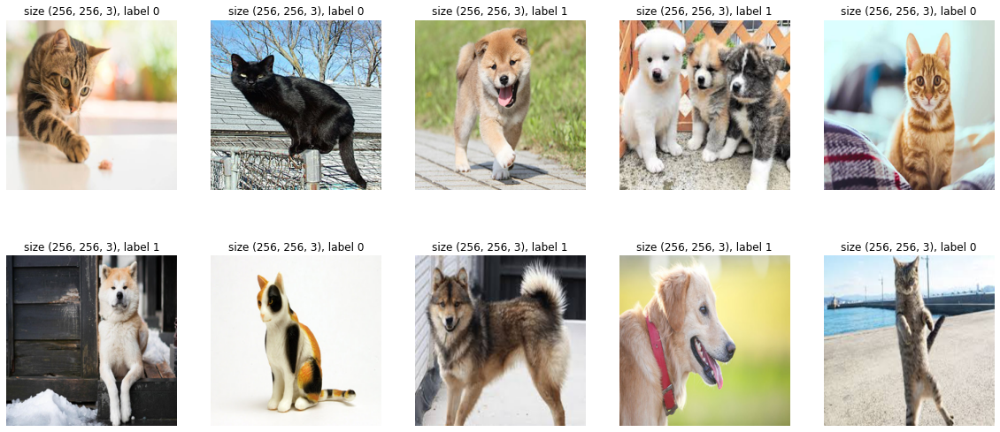

In [7]:

# 画像をリサイズ
dataset_resize = [np.array(image.resize((256,256))) for image in dataset]

fig = plt.figure(figsize=(20,9))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(dataset_resize[i])
    plt.axis('off')
    plt.title('size {}, label {}'.format(dataset_resize[i].shape, target[i]))

### 【解答】学習と推定

In [8]:
import time
import tensorflow as tf
from tensorflow.keras import backend as K

In [6]:
# 画像をfloatに変換
X = np.array(dataset_resize).astype('float64')
# 画像を正規化[0,1]
X /= 255 
# X = (X - 127.5) / 127.5 # 正則化[-1, 1]
# ラベルを数値型に変換し
y = np.array(target).astype(np.int)
# tensorの形を整える
print(X.shape)
X = X.reshape(10,256,256,3) # NCHW
y = y[:, None]

(10, 256, 256, 3)


In [7]:
from sklearn.model_selection import train_test_split
# trainとvalに分割
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=True)

In [8]:
K.clear_session()

input_data = tf.keras.layers.Input(shape=(256,256,3))  # channels last

l = tf.keras.layers.Conv2D(8, (3,3), padding='valid', activation=tf.nn.relu)(input_data)
l = tf.keras.layers.MaxPool2D((3,3), padding='same')(l)
l = tf.keras.layers.Conv2D(16, (3,3), padding='valid', activation=tf.nn.relu)(l)
l = tf.keras.layers.MaxPool2D((3,3), padding='same')(l)
l = tf.keras.layers.Conv2D(32, (3,3), padding='valid', activation=tf.nn.relu)(l)
l = tf.keras.layers.MaxPool2D((3,3), padding='same')(l)
l = tf.keras.layers.Flatten()(l)
output = tf.keras.layers.Dense(1, activation=tf.nn.softmax)(l)

model = tf.keras.Model(input_data, output)

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 254, 254, 8)       224       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 85, 85, 8)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 83, 83, 16)        1168      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 28, 28, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 26, 26, 32)        4640      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 9, 9, 32)          0     

In [9]:
start = time.time()
model.compile(loss='binary_crossentropy',
              optimizer=tf.optimizers.Adam(learning_rate=0.01),
              metrics=['accuracy'])

history = model.fit(X_train, y_train,
                    batch_size=1,
                    epochs=100,
                    verbose=0,
                    validation_data=(X_val, y_val))
end = time.time()
print('wall time: {:.4f}sec'.format(end-start))

score = model.evaluate(X_val, y_val, verbose=0)
print('\nTest loss:', score[0])
print('Test accuracy:', score[1])

wall time: 24.4166sec

Test loss: 7.666619300842285
Test accuracy: 0.5


# 【問題2】分類データセットに対するデータ拡張
データ拡張（Data Augmentation）を行ってください。


《データ拡張のためのライブラリ》


データ拡張にはalbumentationsなどがあります。


[albu/albumentations: fast image augmentation library and easy to use wrapper around other libraries](https://github.com/albu/albumentations)


また、Kerasを使う場合はImageDataGeneratorも便利です。




《データ拡張の効果の調査》


データ拡張には様々な方法があります。今回のタスクにおいて各手法がどう効果があるかを実験・考察してください。

In [2]:
from keras.preprocessing.image import ImageDataGenerator
import cv2
import glob

Using TensorFlow backend.


In [211]:
# kerasのIDGを使ってデータ拡張
save_path = "./img/IDG"
datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        #shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        #channel_shift_range=0.2,
        fill_mode='nearest')

path =  './img/*.jpg'
file_list = glob.glob(path)
#print(file_list)


for i, image in enumerate(file_list):
    #print(image)
    name = image.replace("./img/", "").replace(".jpg","")
    img_array = cv2.imread(image,)
    img_array = img_array.reshape((1,) + img_array.shape)
    
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    i = 0
    for batch in datagen.flow(img_array, batch_size=10,
                          save_to_dir=save_path, save_prefix=name, save_format='jpeg'):
        i += 1
        if i == 10:
            break
    

In [214]:
# 作成したデータを可視化
path = "./img/IDG/"
for i, image in enumerate([name for name in os.listdir(path) if not name.startswith('.')]):
    #print(image)
    if '.jpeg' in image:
        im = PIL.Image.open(path+image)
        #im_rgb = im.convert('RGB')
        dataset.append(im)
        
        # 正解ラベル配列を作成
        if 'cat' in image: 
            target.append(0)
        elif 'dog' in image: 
            target.append(1)

#print(dataset)

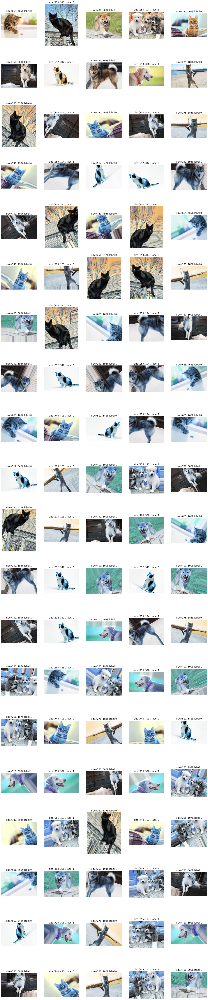

In [215]:
# 一部可視化
fig = plt.figure(figsize=(20,100))
for i in range(100):
    plt.subplot(20, 5, i+1)
    plt.imshow(dataset[i])
    plt.axis('off')
    plt.title('size {}, label {}'.format(dataset[i].size, target[i]))

### 《データ拡張の効果の調査》


データ拡張には様々な方法があります。今回のタスクにおいて各手法がどう効果があるかを実験・考察してください。



# 【問題3】物体検出データセットの用意
次に、物体検出を行います。バウンディングボックスのアノテーションを行い物体検出のためのデータセットを作成してください。


《アノテーションのためのツール》


アノテーションツールにはLabelImgなどがあります。


[tzutalin/labelImg: LabelImg is a graphical image annotation tool and label object bounding boxes in images](https://github.com/tzutalin/labelImg)



In [29]:
# アノテーション用に画像をリサイズ

path =  './img/*.jpg'
file_list = glob.glob(path)
#print(file_list)

for file in file_list:
    img = cv2.imread(file)
    img_resize = cv2.resize(img , (256, 256))
    name = file.replace("./img/","./img/resize/")
    cv2.imwrite(name , img_resize)

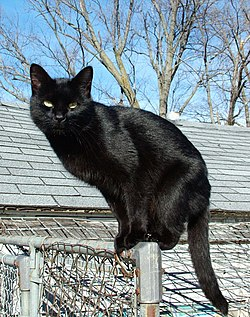

In [37]:
# オリジナル
Image("./img/cat_02.jpg")

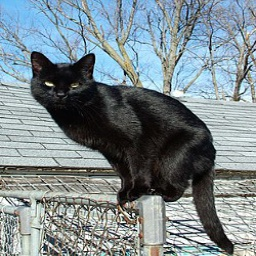

In [38]:
# リサイズ
Image("./img/resize/cat_02.jpg")

In [50]:
# labelImgでアノテーション
# cd /Users/kouta/dive/2007_aug/labelImg
#!python labelImg.py

# アノテーションしたXMLファイルを表示
import xml.etree.ElementTree as ET

In [130]:
xml_path = "./img/XML/"
xml_list = [name for name in os.listdir(xml_path) if not name.startswith('.')]
#print(xml_list)

for xml in xml_list:
    xml = os.path.join(xml_path, xml)
    tree = ET.parse(xml)
    root = tree.getroot()
    print(root.tag)
    break

annotation


In [203]:
# XML解析にbeautifulsoup使ってみる
from bs4 import BeautifulSoup
#xml_path = "./img/XML/"
#xml_list = [name for name in os.listdir(xml_path) if not name.startswith('.')]
#print(xml_list)

xml_list = ["./img/XML/dog_05.xml"]


for xml in xml_list:
    #xml = os.path.join(xml_path, xml)
    with open(xml) as x:
        soup = BeautifulSoup(x, "xml")
        for k,v in enumerate(soup.find_all("name")):
            print(k,v)
        tmp = soup.find_all("name")
        print(tmp)
        #print(soup)
        test = float(soup.xmin.string)
        print(test)
        print(float(soup.xmax.string) - test)
        print(soup.xmax.string)
        print(soup.bndbox.xmin)
        #print(soup.bndbox.xmin.string)
        #xmin = soup.bndbox.xmin.string
        x_min = float(soup.xmin.string)
        y_min = float(soup.ymin.string)
        x_max = float(soup.xmax.string)
        y_max = float(soup.ymax.string)
        bboxes = [x_min, y_min, (x_max - x_min), (y_max - y_min)]
        print(bboxes)
    break

0 <name>dog</name>
1 <name>dog</name>
2 <name>dog</name>
[<name>dog</name>, <name>dog</name>, <name>dog</name>]
6.0
93.0
99
<xmin>6</xmin>
[6.0, 12.0, 93.0, 215.0]


# 【問題4】物体検出データセットに対するデータ拡張
データ拡張（Data Augmentation）を行ってください。前述のalbumentationsはバウンディングボックスを合わせての加工が可能です。詳細はREADME.mdを確認してください。


物体検出の学習を行なうかどうかは任意とします。

In [152]:
import random
import albumentations as A


In [153]:
# 関数を定義する
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White


def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
   
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35, 
        color=TEXT_COLOR, 
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)


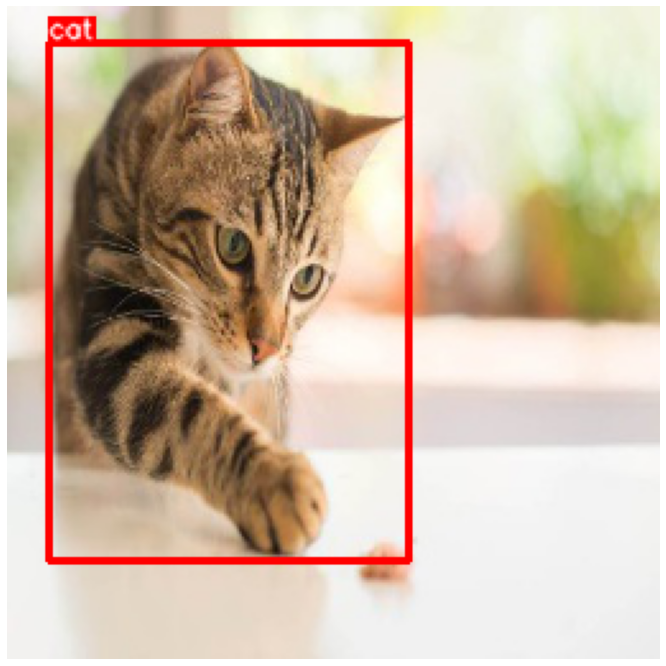

In [220]:
# 画像とbbを取得
xml_path = "./img/XML/"
xml_list = [name for name in os.listdir(xml_path) if not name.startswith('.')]
#print(xml_list)

#xml_list = ["cat_02.xml"]

for xml in xml_list:
    # 格納用リストと辞書初期化
    category_ids =[]
    bboxes = []

    xml = os.path.join(xml_path, xml)
    with open(xml) as x:
        soup = BeautifulSoup(x, "xml")
        image = cv2.imread(soup.path.string)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        category_id_to_name = {0:"cat", 1:"dog"}
        
        for category in soup.find_all("name"):
            if "cat" in category.string:
                category_ids.append(0)
            elif "dog" in category.string:
                category_ids.append(1)
        
        for bb in soup.find_all("bndbox"):
            #print(bb)
            x_min = float(bb.xmin.string)
            y_min = float(bb.ymin.string)
            x_max = float(bb.xmax.string)
            y_max = float(bb.ymax.string)
            bboxes.append([x_min, y_min, (x_max - x_min), (y_max - y_min)])

    visualize(image, bboxes, category_ids, category_id_to_name)
    break


In [221]:
# 拡張パイプラインを定義

transform = A.Compose(
    [A.HorizontalFlip(p=0.5)],
    bbox_params=A.BboxParams(format='coco',  min_visibility=0.3, label_fields=['category_ids']),
)

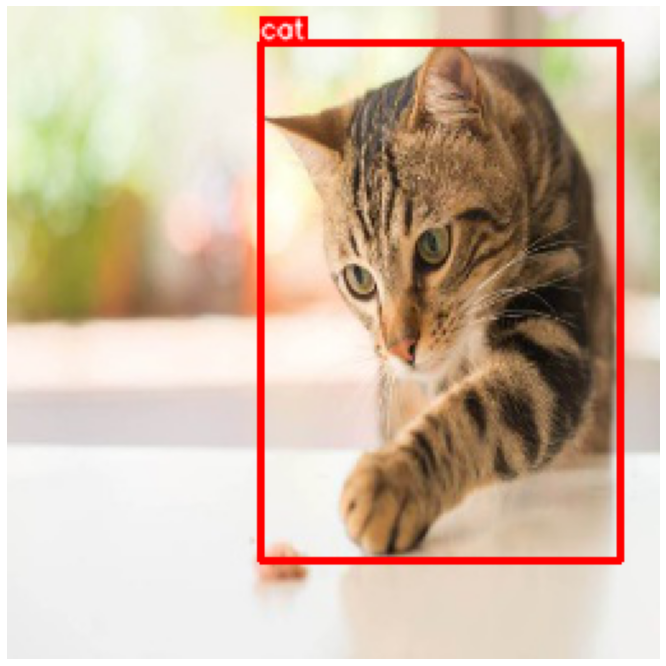

In [222]:
# 水平反転
random.seed(7)
transformed = transform(image=image, bboxes=bboxes, category_ids=category_ids)
visualize(
    transformed['image'],
    transformed['bboxes'],
    transformed['category_ids'],
    category_id_to_name,
)

In [225]:
# シフトスケール回転
shift_transform = A.Compose(
    [A.ShiftScaleRotate(p=5.0)],
    bbox_params=A.BboxParams(format='coco', min_visibility=0.3, label_fields=['category_ids']),
)

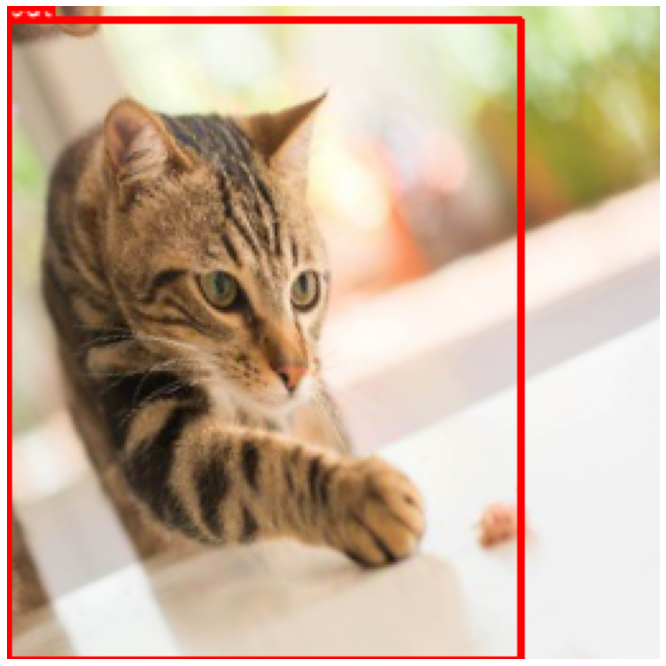

In [226]:
random.seed(100)
transformed = shift_transform(image=image, bboxes=bboxes, category_ids=category_ids)
visualize(
    transformed['image'],
    transformed['bboxes'],
    transformed['category_ids'],
    category_id_to_name,
)